In [3]:
import sys
import os, PATH
import numpy as np
import pandas as pd
import scvelo as scv
import scanpy as sc
import cellrank as cr



scv.settings.verbosity = 3
scv.settings.set_figure_params("scvelo")
cr.settings.verbosity = 2

import warnings

warnings.simplefilter("ignore", category=UserWarning)
warnings.simplefilter("ignore", category=FutureWarning)
warnings.simplefilter("ignore", category=DeprecationWarning)

/home/wergillius/.conda/envs/GenDiff/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
sys.path.append(os.path.join(PATH.main_dir, "script"))

from script.main_train_with_PL_trainer import dl_from_config, get_model_from_config, get_sampler_from_configs
from src._configure import Yaml_configurer
from src import _diffplot as dfp

/home/wergillius/Project/diffuse_differentiate/script/path_n_util.py
/home/wergillius/Project/diffuse_differentiate/machine_config.json


# model setting

- Epsilon_Linear_H256_d3  
    - 'TF_diff/Epsilon_Linear_H256_d3/lightning_logs/version_0'  
    - "configs/TF_atlas/TF_diff/H256_d3.yaml"    
&nbsp;
- Epsilon_Linear_H32_d3  
    - 'TF_diff/Epsilon_Linear_H32_d3/lightning_logs/version_0'
    - "configs/TF_atlas/TF_diff/H32_d3.yaml"

In [10]:
# model H256
# config 
model_config = os.path.join(PATH.main_dir, "configs/TF_atlas/TF_diff/H256_d3.yaml")
configs = Yaml_configurer(model_config)

# model checkpoint
relative_path = 'TF_diff/Epsilon_Linear_H256_d3/lightning_logs/version_0'
ckpt_path = dfp.get_ckpt_path(relative_path)

In [12]:
adata = sc.read_h5ad(
    os.path.join(PATH.main_dir, "data/TFAtlas/diff_cellrank_result.h5ad")
    )

In [95]:
adata.obs['cell_type'] = label_df['predicted.id']

In [96]:
adata.write_h5ad(
    os.path.join(PATH.main_dir, "data/TFAtlas/diff_cellrank_result.h5ad")
    )

In [159]:
adata.obs_keys()

['TF',
 'batch',
 'louvain',
 'n_counts',
 'n_genes',
 'percent_mito',
 'dpt_pseudotime',
 'discrete_time',
 'split',
 'velocity_self_transition',
 'is_large',
 'Cluster Enriched TFs',
 'course_louvain',
 'course_cell_type',
 'clusters_gradients',
 'terminal_states',
 'terminal_states_probs',
 'member_11_1_absorption',
 'member_11_2_absorption',
 'member_12_absorption',
 'member_7_absorption',
 'member_5_absorption',
 'member_6_absorption',
 'cell_type']

# start perturbation  

with model H256

<font size=3> Now we choose to pertube cells with TF that are pro-state `5`, which is a very different lineage from `7-1`.

In [21]:
from importlib import reload

In [22]:
reload(dfp)

<module 'src._diffplot' from '/home/wergillius/Project/diffuse_differentiate/src/_diffplot.py'>

In [26]:
adata_zc, model  = dfp.plot_representation(
    yaml_path = model_config,
    ckpt_path = relative_path,
    use_rep = 'z_c',
    n_neighbors= 15,
    device = 0
)

loadin adata with 28825 cells, which normally takes around 5.54 mins


100%|██████████| 91/91 [00:01<00:00, 67.17it/s] 



cell embedding extracted, ready to computing KNN...

KNN constructed, computing UMAP...


In [98]:
adata_zc.obs = adata.obs.copy()

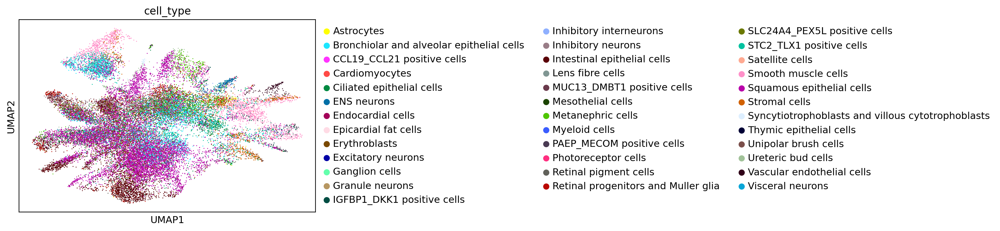

In [100]:
sc.pl.umap(adata, color=['cell_type'])

/home/wergillius/.conda/envs/GenDiff/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


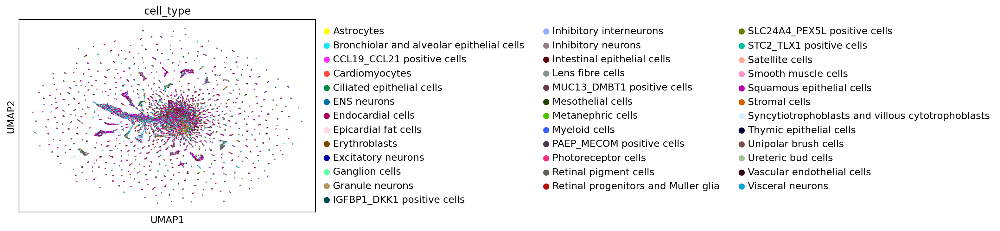

In [99]:
sc.pl.umap(adata_zc, color=['cell_type'])

In [31]:
adata_perturb, model  = dfp.perturbation(
    yaml_path = model_config,
    ckpt_path = relative_path,
    perturbation = 'TFORF0820-LHX6',
    n_neighbors= 15,
    device = 0,
    return_adata=True,
    compute_neighbor=True,
    compute_umap=True
)

loadin adata with 28825 cells, which normally takes around 5.54 mins


100%|██████████| 91/91 [00:01<00:00, 69.05it/s] 



cell embedding extracted, ready to computing KNN...

KNN constructed, computing UMAP...


In [34]:
adata_perturb.obs = adata.obs.copy()

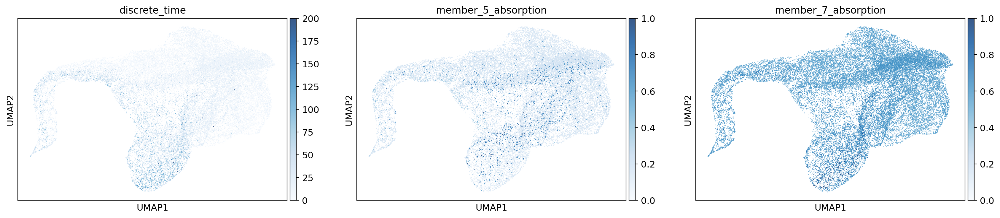

In [41]:
sc.pl.umap(adata_perturb, cmap='Blues', alpha=0.8,
           color=['discrete_time', 
                  'member_5_absorption',
                  'member_7_absorption'])

In [113]:
!jupyter nbextension enable --py widgetsnbextension

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK


In [111]:
pLHX6_ad = dfp.compute_velocity(adata, 
                velocity_matrix = adata_perturb.obsm['delta_x'], 
                                n_jobs=20)

computing velocity graph (using 20/48 cores)


ImportError: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html

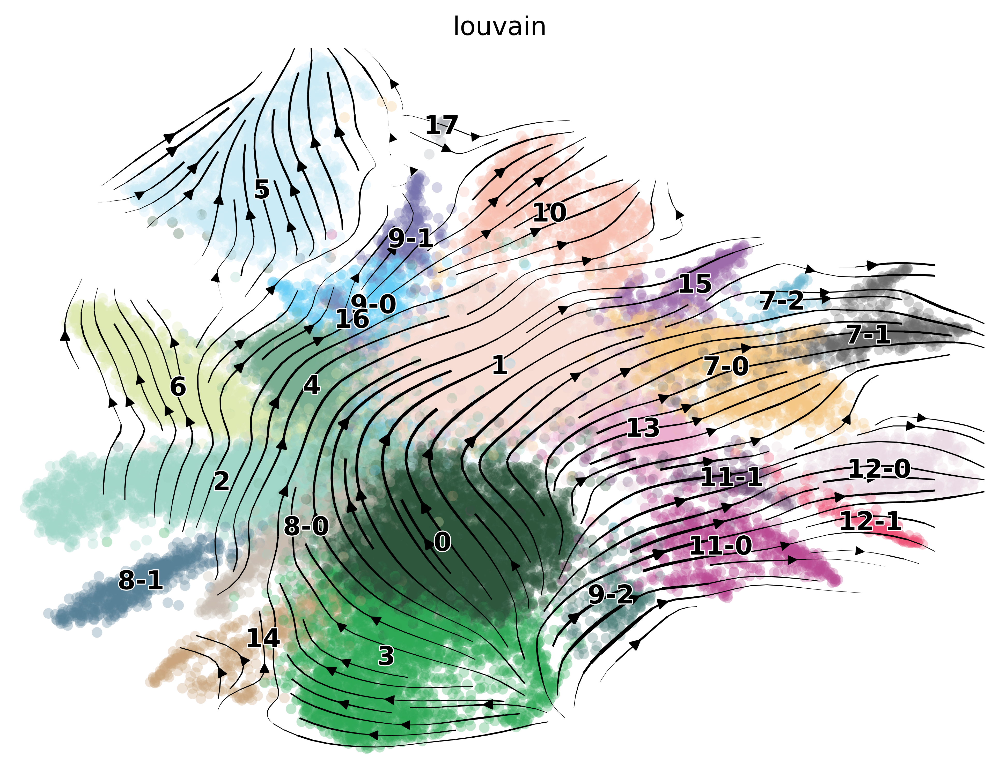

In [20]:
scv.pl.velocity_embedding_stream(pLHX6_ad, 
                                 figsize=(4,3), dpi=100)

# compute velocity similarity

In [73]:
from scipy.spatial.distance import cosine

In [123]:
import torch

In [78]:
from matplotlib import pyplot as plt

In [27]:
original_delta_x = adata_zc.obsm['delta_x']
pertub_delta_x = adata_perturb.obsm['delta_x']

In [115]:
same_perturb_cb = adata_zc.obs.query("`TF` == 'TFORF0820-LHX6'").index

In [ ]:
adata.uns

In [127]:
model = model.eval().to('cpu')

In [126]:
test_ad = adata[same_perturb_cb].copy()
test_X = torch.from_numpy(test_ad.X).float()
test_t = torch.from_numpy(test_ad.obs['discrete_time'].values)
test_c = test_ad.obs['TF'].values

In [147]:
c_vec = np.array([adata.uns['unique_token_dict'][c] for c in test_c])

In [132]:
adata.uns['unique_token_dict']['TFORF0098-MSGN1']

98

In [150]:
C1 = torch.from_numpy(c_vec)

In [137]:
C2 = torch.from_numpy(np.array([98]*6))

In [153]:
pred_deltaX= model.model(test_X, test_t, None, C.long()).detach().numpy()

In [146]:
pred_deltaX2= model.model(test_X, test_t, None, C2).detach().numpy()

In [155]:
1 - cosine(pred_deltaX[0], pred_deltaX2[0])

1

In [139]:
pred_deltaX2

tensor([[ 0.0017, -0.0036, -0.0041,  ..., -0.0009,  0.0126, -0.0037],
        [ 0.0017, -0.0036, -0.0040,  ..., -0.0009,  0.0126, -0.0037],
        [ 0.0017, -0.0036, -0.0041,  ..., -0.0009,  0.0126, -0.0037],
        [ 0.0017, -0.0036, -0.0041,  ..., -0.0009,  0.0126, -0.0037],
        [ 0.0017, -0.0036, -0.0041,  ..., -0.0009,  0.0126, -0.0037],
        [ 0.0017, -0.0036, -0.0041,  ..., -0.0009,  0.0126, -0.0037]],
       grad_fn=<NativeBatchNormBackward0>)

In [130]:
pred_deltaX

tensor([[ 0.0017, -0.0036, -0.0042,  ..., -0.0009,  0.0126, -0.0038],
        [ 0.0017, -0.0036, -0.0041,  ..., -0.0009,  0.0125, -0.0038],
        [ 0.0017, -0.0036, -0.0042,  ..., -0.0009,  0.0126, -0.0038],
        [ 0.0017, -0.0036, -0.0042,  ..., -0.0009,  0.0126, -0.0038],
        [ 0.0017, -0.0036, -0.0042,  ..., -0.0009,  0.0126, -0.0038],
        [ 0.0017, -0.0036, -0.0042,  ..., -0.0009,  0.0126, -0.0037]],
       grad_fn=<NativeBatchNormBackward0>)

In [64]:
exclude_cluster = ['5', '10', '12', '11', '10', '17']
sub_index = adata.obs.query('0.4 <= `member_7_absorption` <= 0.7').query(
      '`course_louvain` not in @exclude_cluster').index

subsect = [i in sub_index for i in adata.obs.index] 

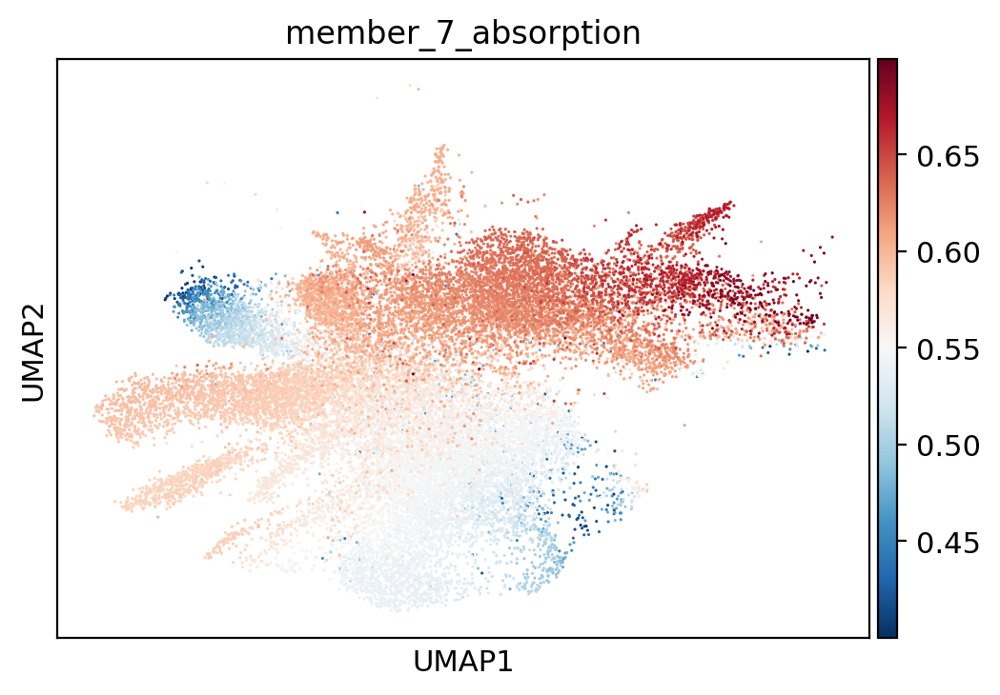

In [65]:
sc.pl.umap(adata[sub_index], color=['member_7_absorption'])

In [156]:
M = 1- np.array([cosine(p, o) for p,o in zip(pertub_delta_x, original_delta_x)])

In [157]:
np.max(M)

1.0

(array([2.0000e+00, 6.0000e+00, 1.0000e+00, 5.0000e+00, 4.0000e+00,
        9.0000e+00, 1.1000e+01, 2.6000e+01, 2.0000e+02, 2.8561e+04]),
 array([0.96430129, 0.96787116, 0.97144103, 0.9750109 , 0.97858077,
        0.98215064, 0.98572052, 0.98929039, 0.99286026, 0.99643013,
        1.        ]),
 <BarContainer object of 10 artists>)

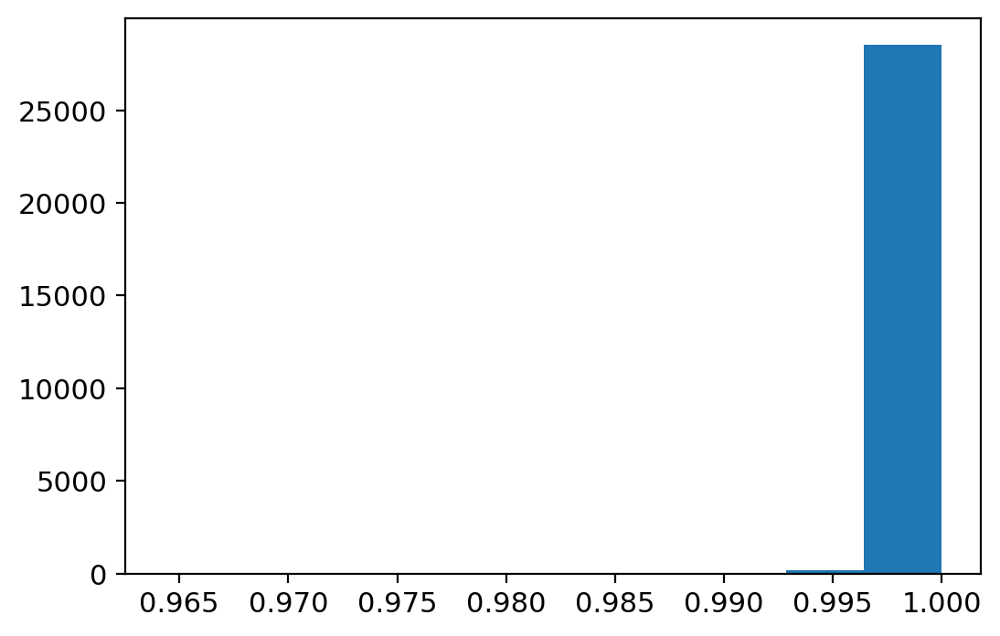

In [158]:
plt.hist(M)

# H32

In [168]:

# model H32
# config
H32_model_config = os.path.join(PATH.main_dir, "configs/TF_atlas/TF_diff/H32_d3.yaml")
H32_configs = Yaml_configurer(H32_model_config)

# model checkpoint
H32_relative_path = 'TF_diff/Epsilon_Linear_H32_d3/lightning_logs/version_0'
H32_ckpt_path = dfp.get_ckpt_path(relative_path)

In [169]:
H32_adata_perturb, H32_model  = dfp.perturbation(
    yaml_path = H32_model_config,
    ckpt_path = H32_relative_path,
    perturbation = 'TFORF0820-LHX6',
    n_neighbors= 15,
    device = 0,
    return_adata=True,
    compute_neighbor=True,
    compute_umap=True
)

loadin adata with 28825 cells, which normally takes around 5.54 mins



100%|██████████| 730/730 [01:14<00:00,  9.82it/s]

100%|██████████| 82/82 [00:01<00:00, 60.01it/s]

100%|██████████| 91/91 [00:01<00:00, 58.37it/s]



cell embedding extracted, ready to computing KNN...

KNN constructed, computing UMAP...


Exception ignored in: <function tqdm.__del__ at 0x7ffeefdc7940>
Traceback (most recent call last):
  File "/home/wergillius/.conda/envs/GenDiff/lib/python3.8/site-packages/tqdm/std.py", line 1145, in __del__
    self.close()
  File "/home/wergillius/.conda/envs/GenDiff/lib/python3.8/site-packages/tqdm/notebook.py", line 283, in close
    self.disp(bar_style='danger', check_delay=False)
AttributeError: 'tqdm_notebook' object has no attribute 'disp'


In [170]:
pLHX6_ad = dfp.compute_velocity(adata, 
                velocity_matrix = H32_adata_perturb.obsm['delta_x'], 
                                n_jobs=20)

computing velocity graph (using 20/48 cores)


ImportError: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html

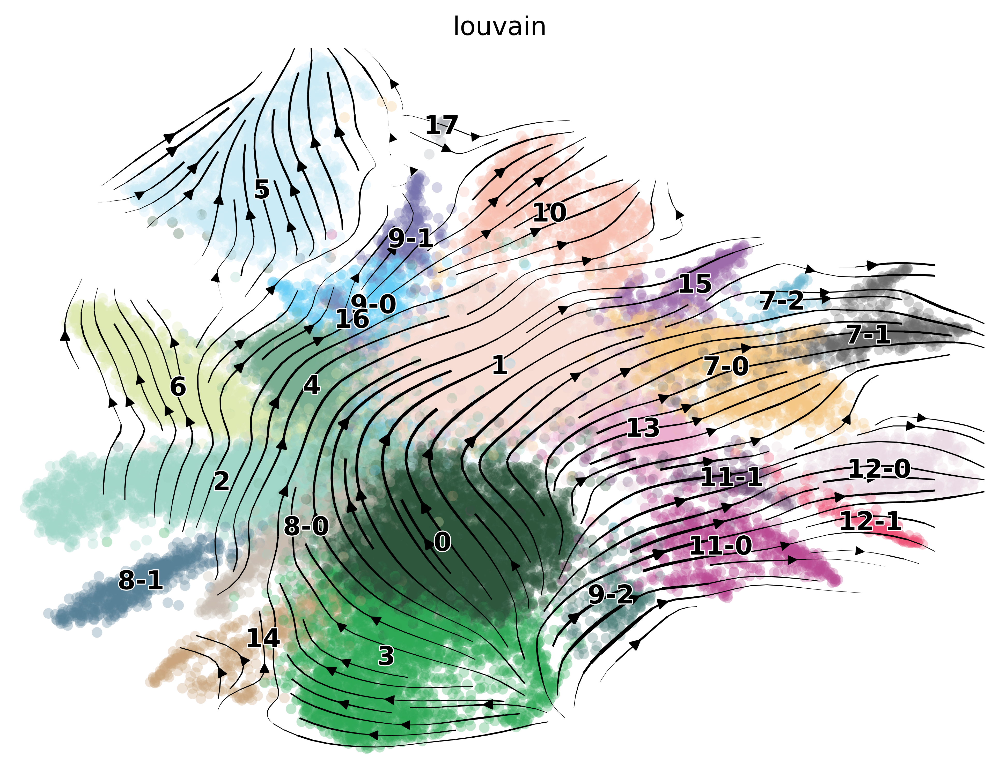

In [20]:
scv.pl.velocity_embedding_stream(pLHX6_ad, 
                                 figsize=(4,3), dpi=100)

In [ ]:
H32_model = H32_model.eval().to('cpu')

In [160]:
pred_deltaX= H32_model.model(test_X, test_t, None, C.long()).detach().numpy()

NameError: name 'H32_model' is not defined